In [1]:
import scanpy as sc
import omicverse as ov

ov.plot_set()

2024-11-22 01:36:18.393779: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-22 01:36:18.855452: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-22 01:36:18.951344: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-22 01:36:24.592075: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT



   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.9, Tutorials: https://omicverse.readthedocs.io/
Dependency error: (pydeseq2 0.4.11 (/mnt/home/zehuazeng/software/rsc/lib/python3.10/site-packages), Requirement.parse('pydeseq2<=0.4.0,>=0.3'))


In [2]:
adata=ov.read('data/GC_All_SCVI.h5ad')
adata

AnnData object with n_obs × n_vars = 150222 × 15496
    obs: 'patient', 'CancerType', 'CancerStage', 'nUMIs', 'mito_perc', 'detected_genes', 'cell_complexity', 'n_genes', 'doublet_score', 'predicted_doublet', 'passing_mt', 'passing_nUMIs', 'passing_ngenes', '_scvi_batch', '_scvi_labels', 'leiden', 'celltype_gbi', 'celltype_gpt', 'best_clusters', 'gpt_celltype_0', 'gpt_celltype_1', 'gpt_celltype_2', 'gpt_celltype_3', 'gpt_celltype_4', 'best_celltype', 'Major_celltype', 'Minor_celltype', 'C_scANVI'
    var: 'mt', 'n_cells', 'percent_cells', 'robust', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly_variable_features'
    uns: 'celltype_gbi_colors', 'hvg', 'log1p', 'neighbors', 'patient_colors', 'pca', 'scaled|original|cum_sum_eigenvalues', 'scaled|original|pca_var_ratios', 'scrublet'
    obsm: 'X_mde', 'X_mde_pca', 'X_mde_scANVI', 'X_mde_scVI', 'X_pca', 'X_scANVI', 'X_scVI', 'scaled|original|X_pca'
   

In [3]:
def celltype_anno_scmulan(adata, ckp_path, output_dir, tissue, batch_size=5000):
    import numpy as np
    import scanpy as sc
    import gc

    # Copy the count data to the main matrix
    adata.X = adata.layers['counts'].copy()

    # Uniform gene symbols
    adata_GS_uniformed = ov.externel.scMulan.GeneSymbolUniform(input_adata=adata,
                                                               output_dir=output_dir,
                                                               output_prefix=tissue)

    # Initialize containers for results
    cell_type_results = []
    embeddings_results = []

    # Process in batches
    num_cells = adata_GS_uniformed.shape[0]
    for start in range(0, num_cells, batch_size):
        end = min(start + batch_size, num_cells)
        adata_batch = adata_GS_uniformed[start:end].copy()

        # Norm and log1p count matrix
        if adata_batch.X.max() > 10:
            sc.pp.normalize_total(adata_batch, target_sum=1e4)
            sc.pp.log1p(adata_batch)

        # Model inference
        scml = ov.externel.scMulan.model_inference(ckp_path, adata_batch)
        base_process = scml.cuda_count()
        scml.get_cell_types_and_embds_for_adata(parallel=True, n_process=base_process)

        # Collect results
        cell_type_results.append(scml.adata.obs['cell_type_from_scMulan'].copy())
        embeddings_results.append(scml.adata.obsm['X_scMulan'].copy())

        # Clean up
        del scml
        del adata_batch
        gc.collect()

    del adata_GS_uniformed
    gc.collect()
    return cell_type_results,embeddings_results

    # Merge results
    adata.obs['cell_type_from_scMulan'] = np.concatenate(cell_type_results)
    adata.obsm['X_scMulan'] = np.vstack(embeddings_results)

    # Retrieve and assign additional data
    adata.obsm[adata.uns['bench_best_res']] = adata_GS_uniformed.obsm[adata.uns['bench_best_res']]
    adata.obsm['X_mde'] = adata_GS_uniformed.obsm['X_mde']

    # Smoothing and refining labels
    ov.externel.scMulan.cell_type_smoothing(adata, use_rep=adata.uns['bench_best_res'],
                                            n_pcs=10, threshold=0.1)
    adata.obs['cell_type_from_mulan_smooth_ov'] = ov.utils.refine_label(
        adata, use_rep='X_mde', radius=30, key='cell_type_from_scMulan')

    # Final cleanup
    del adata_GS_uniformed
    gc.collect()

In [4]:
cell_type_results,embeddings_results=celltype_anno_scmulan(adata,ckp_path='/mnt/home/zehuazeng/analysis/scMulan/ckpt/ckpt_scMulan.pt',
                      output_dir='result',batch_size=10000,
                     tissue='stomatch')
ov.utils.save(cell_type_results,'result/cell_type_results.pkl')
ov.utils.save(embeddings_results,'result/embeddings_results.pkl')

{message}
The shape of query data is: (150222, 15496)
The length of reference gene_list is: 42117
Performing gene symbol uniform, this step may take several minutes


Processing: 100%|██████████| 15496/15496 [00:07<00:00, 2188.88it/s]


Building output data, this step may take several minutes


Processing: 100%|██████████| 15496/15496 [00:23<00:00, 652.57it/s] 


Because the number of cells is very large, we construct the sparse matrix parallelly with 10 threads


Building matrices: 100%|██████████| 10/10 [00:46<00:00,  4.66s/it]


Shape of output data is (150222, 42117). It should have 42117 genes with cell number unchanged.
h5ad file saved in:/mnt/home/zehuazeng/analysis/24_GC/result/stomatch_uniformed.h5ad
report file saved in: /mnt/home/zehuazeng/analysis/24_GC/result/stomatch_report.csv
normalizing counts per cell
    finished (0:00:00)
number of parameters: 368.80M
✅ adata passed check
👸 scMulan is ready
scMulan is currently available to 1 GPUs.
⚡ Speed up by multiprocessing with 1 processes and 1 GPUs...


2024-11-14 03:32:24.414227: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-14 03:32:24.432351: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-14 03:32:24.436839: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-14 03:32:25.121038: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT



   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.9, Tutorials: https://omicverse.readthedocs.io/


⏳ Generating cell type labels and embds for each cell on device 0: 100%|██████████| 10000/10000 [11:24<00:00, 14.61it/s]


normalizing counts per cell
    finished (0:00:00)
number of parameters: 368.80M
✅ adata passed check
👸 scMulan is ready
scMulan is currently available to 1 GPUs.
⚡ Speed up by multiprocessing with 1 processes and 1 GPUs...


2024-11-14 03:44:03.723686: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-14 03:44:03.739503: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-14 03:44:03.744341: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-14 03:44:04.548016: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT



   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.9, Tutorials: https://omicverse.readthedocs.io/


⏳ Generating cell type labels and embds for each cell on device 0: 100%|██████████| 10000/10000 [11:22<00:00, 14.66it/s]


normalizing counts per cell
    finished (0:00:00)
number of parameters: 368.80M
✅ adata passed check
👸 scMulan is ready
scMulan is currently available to 1 GPUs.
⚡ Speed up by multiprocessing with 1 processes and 1 GPUs...


2024-11-14 03:55:43.879552: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-14 03:55:43.900243: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-14 03:55:43.906635: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-14 03:55:44.932575: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT



   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.9, Tutorials: https://omicverse.readthedocs.io/


⏳ Generating cell type labels and embds for each cell on device 0: 100%|██████████| 10000/10000 [12:46<00:00, 13.04it/s]


normalizing counts per cell
    finished (0:00:00)
number of parameters: 368.80M
✅ adata passed check
👸 scMulan is ready
scMulan is currently available to 1 GPUs.
⚡ Speed up by multiprocessing with 1 processes and 1 GPUs...


2024-11-14 04:08:47.070127: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-14 04:08:47.088392: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-14 04:08:47.093968: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-14 04:08:47.963950: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT



   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.9, Tutorials: https://omicverse.readthedocs.io/


⏳ Generating cell type labels and embds for each cell on device 0: 100%|██████████| 10000/10000 [11:50<00:00, 14.07it/s]


normalizing counts per cell
    finished (0:00:00)
number of parameters: 368.80M
✅ adata passed check
👸 scMulan is ready
scMulan is currently available to 1 GPUs.
⚡ Speed up by multiprocessing with 1 processes and 1 GPUs...


2024-11-14 04:20:56.048252: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-14 04:20:56.066354: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-14 04:20:56.071910: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-14 04:20:56.964029: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT



   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.9, Tutorials: https://omicverse.readthedocs.io/


⏳ Generating cell type labels and embds for each cell on device 0: 100%|██████████| 10000/10000 [11:39<00:00, 14.30it/s]


normalizing counts per cell
    finished (0:00:00)
number of parameters: 368.80M
✅ adata passed check
👸 scMulan is ready
scMulan is currently available to 1 GPUs.
⚡ Speed up by multiprocessing with 1 processes and 1 GPUs...


2024-11-14 04:32:52.723491: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-14 04:32:52.744156: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-14 04:32:52.750522: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-14 04:32:53.779960: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT



   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.9, Tutorials: https://omicverse.readthedocs.io/


⏳ Generating cell type labels and embds for each cell on device 0: 100%|██████████| 10000/10000 [11:46<00:00, 14.15it/s]


normalizing counts per cell
    finished (0:00:00)
number of parameters: 368.80M
✅ adata passed check
👸 scMulan is ready
scMulan is currently available to 1 GPUs.
⚡ Speed up by multiprocessing with 1 processes and 1 GPUs...


2024-11-14 04:44:56.368270: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-14 04:44:56.384113: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-14 04:44:56.389000: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-14 04:44:57.229588: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT



   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.9, Tutorials: https://omicverse.readthedocs.io/


⏳ Generating cell type labels and embds for each cell on device 0: 100%|██████████| 10000/10000 [12:02<00:00, 13.85it/s]


normalizing counts per cell
    finished (0:00:00)
number of parameters: 368.80M
✅ adata passed check
👸 scMulan is ready
scMulan is currently available to 1 GPUs.
⚡ Speed up by multiprocessing with 1 processes and 1 GPUs...


2024-11-14 04:57:15.050086: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-14 04:57:15.070700: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-14 04:57:15.077061: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-14 04:57:16.102124: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT



   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.9, Tutorials: https://omicverse.readthedocs.io/


⏳ Generating cell type labels and embds for each cell on device 0: 100%|██████████| 10000/10000 [12:16<00:00, 13.57it/s]


normalizing counts per cell
    finished (0:00:00)
number of parameters: 368.80M
✅ adata passed check
👸 scMulan is ready
scMulan is currently available to 1 GPUs.
⚡ Speed up by multiprocessing with 1 processes and 1 GPUs...


2024-11-14 05:09:48.081006: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-14 05:09:48.099383: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-14 05:09:48.105033: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-14 05:09:48.915077: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT



   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.9, Tutorials: https://omicverse.readthedocs.io/


⏳ Generating cell type labels and embds for each cell on device 0: 100%|██████████| 10000/10000 [06:38<00:00, 25.09it/s]


normalizing counts per cell
    finished (0:00:00)
number of parameters: 368.80M
✅ adata passed check
👸 scMulan is ready
scMulan is currently available to 1 GPUs.
⚡ Speed up by multiprocessing with 1 processes and 1 GPUs...


2024-11-14 05:16:45.351252: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-14 05:16:45.372234: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-14 05:16:45.378657: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-14 05:16:46.387231: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT



   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.9, Tutorials: https://omicverse.readthedocs.io/


⏳ Generating cell type labels and embds for each cell on device 0: 100%|██████████| 10000/10000 [05:04<00:00, 32.89it/s]


normalizing counts per cell
    finished (0:00:00)
number of parameters: 368.80M
✅ adata passed check
👸 scMulan is ready
scMulan is currently available to 1 GPUs.
⚡ Speed up by multiprocessing with 1 processes and 1 GPUs...


2024-11-14 05:22:07.965342: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-14 05:22:07.986111: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-14 05:22:07.992462: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-14 05:22:09.021830: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT



   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.9, Tutorials: https://omicverse.readthedocs.io/


⏳ Generating cell type labels and embds for each cell on device 0: 100%|██████████| 10000/10000 [06:02<00:00, 27.58it/s]


normalizing counts per cell
    finished (0:00:00)
number of parameters: 368.80M
✅ adata passed check
👸 scMulan is ready
scMulan is currently available to 1 GPUs.
⚡ Speed up by multiprocessing with 1 processes and 1 GPUs...


2024-11-14 05:28:26.485271: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-14 05:28:26.501087: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-14 05:28:26.505946: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-14 05:28:27.382838: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT



   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.9, Tutorials: https://omicverse.readthedocs.io/


⏳ Generating cell type labels and embds for each cell on device 0: 100%|██████████| 10000/10000 [07:20<00:00, 22.72it/s]


normalizing counts per cell
    finished (0:00:00)
number of parameters: 368.80M
✅ adata passed check
👸 scMulan is ready
scMulan is currently available to 1 GPUs.
⚡ Speed up by multiprocessing with 1 processes and 1 GPUs...


2024-11-14 05:36:02.993166: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-14 05:36:03.013956: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-14 05:36:03.020353: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-14 05:36:04.045323: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT



   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.9, Tutorials: https://omicverse.readthedocs.io/


⏳ Generating cell type labels and embds for each cell on device 0: 100%|██████████| 10000/10000 [07:07<00:00, 23.37it/s]


normalizing counts per cell
    finished (0:00:00)
number of parameters: 368.80M
✅ adata passed check
👸 scMulan is ready
scMulan is currently available to 1 GPUs.
⚡ Speed up by multiprocessing with 1 processes and 1 GPUs...


2024-11-14 05:43:29.122638: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-14 05:43:29.140710: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-14 05:43:29.146267: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-14 05:43:30.055640: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT



   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.9, Tutorials: https://omicverse.readthedocs.io/


⏳ Generating cell type labels and embds for each cell on device 0: 100%|██████████| 10000/10000 [07:05<00:00, 23.50it/s]


normalizing counts per cell
    finished (0:00:00)
number of parameters: 368.80M
✅ adata passed check
👸 scMulan is ready
scMulan is currently available to 1 GPUs.
⚡ Speed up by multiprocessing with 1 processes and 1 GPUs...


2024-11-14 05:50:52.360422: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-14 05:50:52.381235: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-14 05:50:52.387613: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-14 05:50:53.415384: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT



   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.9, Tutorials: https://omicverse.readthedocs.io/


⏳ Generating cell type labels and embds for each cell on device 0: 100%|██████████| 10000/10000 [07:22<00:00, 22.58it/s]


normalizing counts per cell
    finished (0:00:00)
number of parameters: 368.80M
✅ adata passed check
👸 scMulan is ready
scMulan is currently available to 1 GPUs.
⚡ Speed up by multiprocessing with 1 processes and 1 GPUs...


2024-11-14 05:58:29.862842: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-14 05:58:29.878803: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-14 05:58:29.883693: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-14 05:58:30.738718: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT



   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.9, Tutorials: https://omicverse.readthedocs.io/


⏳ Generating cell type labels and embds for each cell on device 0: 100%|██████████| 222/222 [00:09<00:00, 23.34it/s]


In [ ]:
cell_type_results

In [8]:
import numpy as np
adata.obs['cell_type_from_scMulan'] =np.concatenate(cell_type_results)
adata.obsm['X_scMulan'] = np.vstack(embeddings_results)

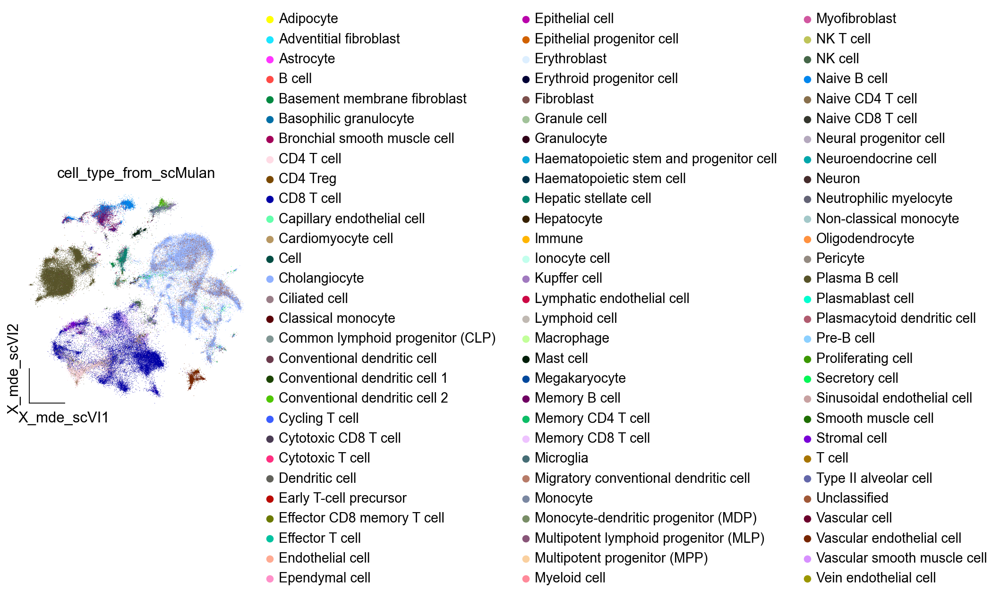

In [9]:
ov.pl.embedding(adata,
                basis='X_mde_scVI',
                color='cell_type_from_scMulan',
                frameon='small')

In [11]:
adata.uns['bench_best_res']='X_scVI'

In [ ]:
# Smoothing and refining labels
ov.externel.scMulan.cell_type_smoothing(adata, use_rep=adata.uns['bench_best_res'],
                                        n_pcs=10, threshold=0.1)

In [15]:
adata

AnnData object with n_obs × n_vars = 150222 × 15496
    obs: 'patient', 'CancerType', 'CancerStage', 'nUMIs', 'mito_perc', 'detected_genes', 'cell_complexity', 'n_genes', 'doublet_score', 'predicted_doublet', 'passing_mt', 'passing_nUMIs', 'passing_ngenes', '_scvi_batch', '_scvi_labels', 'leiden', 'celltype_gbi', 'celltype_gpt', 'best_clusters', 'gpt_celltype_0', 'gpt_celltype_1', 'gpt_celltype_2', 'gpt_celltype_3', 'gpt_celltype_4', 'best_celltype', 'Major_celltype', 'Minor_celltype', 'C_scANVI', 'cell_type_from_scMulan', 'cell_type_from_mulan_smoothing', 'smoothing_score'
    var: 'mt', 'n_cells', 'percent_cells', 'robust', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly_variable_features'
    uns: 'celltype_gbi_colors', 'hvg', 'log1p', 'neighbors', 'patient_colors', 'pca', 'scaled|original|cum_sum_eigenvalues', 'scaled|original|pca_var_ratios', 'scrublet', 'cell_type_from_scMulan_colors', 'bench_

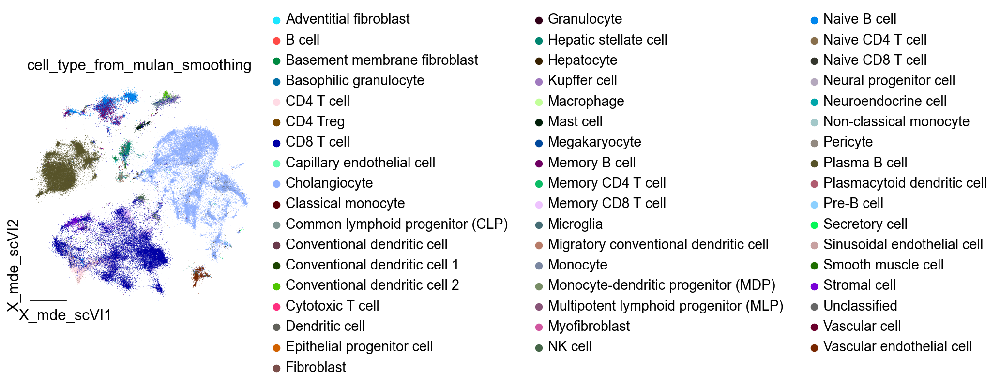

In [16]:
ov.pl.embedding(adata,
                basis='X_mde_scVI',
                color='cell_type_from_mulan_smoothing',
                frameon='small')

Storing dendrogram info using `.uns['dendrogram_leiden']`
ranking genes
    finished: added to `.uns['leiden_ttest']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:19)


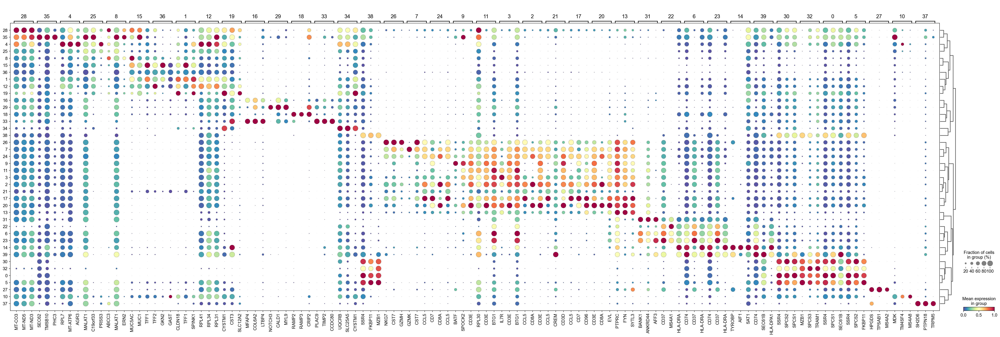

In [18]:
sc.tl.dendrogram(adata,'leiden',use_rep='X_scVI')
sc.tl.rank_genes_groups(adata, 'leiden', use_rep='X_scVI',
                        method='t-test',use_raw=False,key_added='leiden_ttest')
sc.pl.rank_genes_groups_dotplot(adata,groupby='leiden',
                                cmap='Spectral_r',key='leiden_ttest',
                                standard_scale='var',n_genes=3)

In [19]:
all_markers=ov.single.get_celltype_marker(adata,clustertype='leiden',rank=True,
                                          key='leiden_ttest',
                                          foldchange=2,topgenenumber=15)
#all_markers

...get cell type marker


In [20]:
import gptbioinsightor as gbi 

### 设置大语言模型的API KEY
import os
os.environ['API_KEY'] = "sk-f03e62ed77fc4ce38682e3b6a887064c"

# 设置数据的背景信息
background = f"Cells from stomach human" 

# 确保adata已经进行了差异基因分析，例如: sc.tl.rank_genes_groups(adata, "leiden", method="wilcoxon")
# 我们使用Aliyun 的 qwen2-72b-instruct 进行演示, 但你也可以使用 openai gpt-4o
res = gbi.get_celltype(all_markers, background=background, 
                    out="result/celltype_info.md", 
                    topnumber=15,provider="aliyun", model="qwen-max")
adata.obs['celltype_gbi']=adata.obs['leiden'].map(res)


In [21]:
adata.uns['marker_dict']=all_markers
adata.obs['best_clusters']=adata.obs['leiden']

In [22]:
import os
os.environ['AGI_API_KEY'] = 'sk-FF3MmMGS836Ca29A00A6T3BLBKFJ3BC8ebf196c444659442'  # Replace with your actual API key


In [23]:
def celltype_anno_gpt4celltype(adata,model='gpt-4o',base_url="https://aigptx.top/v1",gpt_num=5):
    result_gpt_dict={}
    from tqdm import tqdm
    for t in tqdm(range(gpt_num)):
        result_gpt = ov.single.gptcelltype(adata.uns['marker_dict'],
                                       tissuename='stomach', speciename='human',
                              model=model,base_url=base_url,
                              topgenenumber=10)
        result_gpt_dict[t]=result_gpt
        adata.obs[f'gpt_celltype_{t}'] = adata.obs['best_clusters'].map(result_gpt).astype('category')
celltype_anno_gpt4celltype(adata)

  0%|          | 0/5 [00:00<?, ?it/s]

Note: AGI API key found: returning the cell type annotations.


 20%|██        | 1/5 [00:04<00:16,  4.22s/it]

Note: It is always recommended to check the results returned by GPT-4 in case of AI hallucination, before going to downstream analysis.
Note: AGI API key found: returning the cell type annotations.


 40%|████      | 2/5 [00:09<00:14,  4.92s/it]

Note: It is always recommended to check the results returned by GPT-4 in case of AI hallucination, before going to downstream analysis.
Note: AGI API key found: returning the cell type annotations.


 60%|██████    | 3/5 [00:14<00:09,  4.98s/it]

Note: It is always recommended to check the results returned by GPT-4 in case of AI hallucination, before going to downstream analysis.
Note: AGI API key found: returning the cell type annotations.


 80%|████████  | 4/5 [00:19<00:04,  4.84s/it]

Note: It is always recommended to check the results returned by GPT-4 in case of AI hallucination, before going to downstream analysis.
Note: AGI API key found: returning the cell type annotations.


100%|██████████| 5/5 [00:24<00:00,  4.98s/it]

Note: It is always recommended to check the results returned by GPT-4 in case of AI hallucination, before going to downstream analysis.


In [26]:
gpt_num=5
cluster_celltypes={}
adata.obs['best_clusters']=adata.obs['best_clusters'].astype('category')
for ct in adata.obs['best_clusters'].cat.categories:
    ct1=adata.obs.loc[adata.obs['best_clusters']==ct,'celltype_gbi'].value_counts().index[0]
    ct2=adata.obs.loc[adata.obs['best_clusters']==ct,'cell_type_from_mulan_smoothing'].value_counts().index[0]
    ct_li=[]
    for num in range(gpt_num):
        ct_li.append(adata.obs.loc[adata.obs['best_clusters']==ct,f'gpt_celltype_{num}'].value_counts().index[0])

    cluster_celltypes[ct]=[ct1,ct2]+ct_li

cluster_markers = adata.uns['marker_dict']

# 调用函数并打印结果
result = get_cluster_celltype(cluster_celltypes, cluster_markers, 
                              species='human', organization='stomach',
                             model='gpt-4o',base_url="https://aigptx.top/v1")
adata.obs['best_celltype'] = adata.obs['best_clusters'].map(result).astype('category')

100%|██████████| 40/40 [00:33<00:00,  1.21it/s]


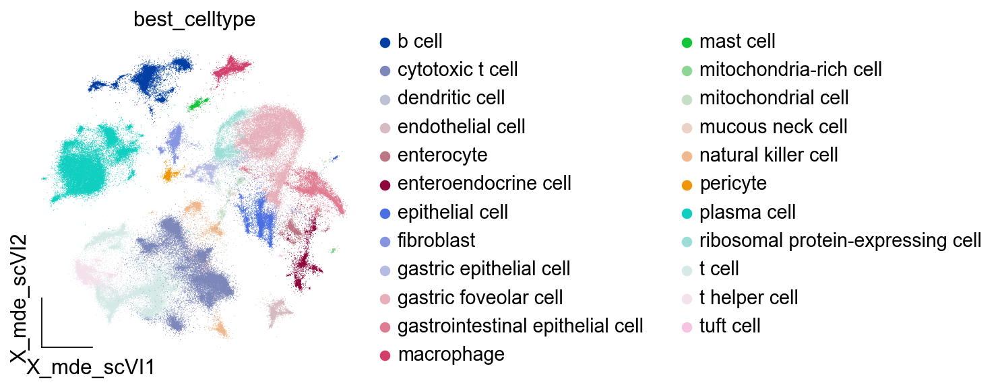

In [28]:
ov.pl.embedding(adata,
                basis='X_mde_scVI',
                color='best_celltype',
                frameon='small')

In [30]:
adata.obs['best_celltype']=[i.capitalize() for i in adata.obs['best_celltype'].tolist()]

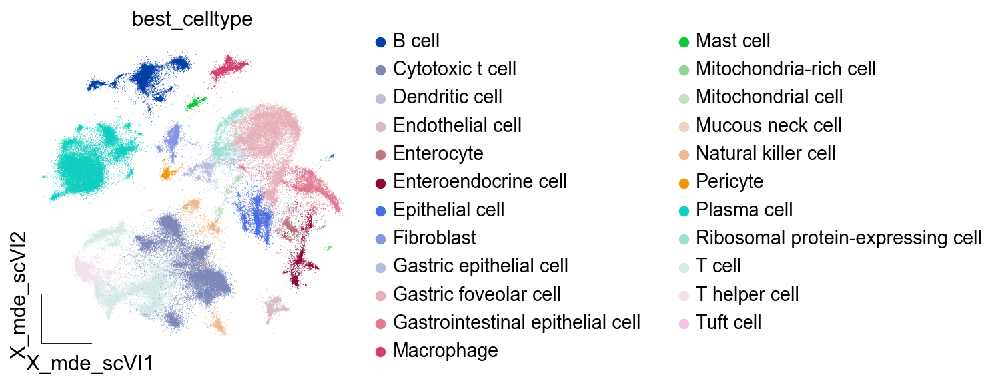

In [31]:
ov.pl.embedding(adata,
                basis='X_mde_scVI',
                color='best_celltype',
                frameon='small')

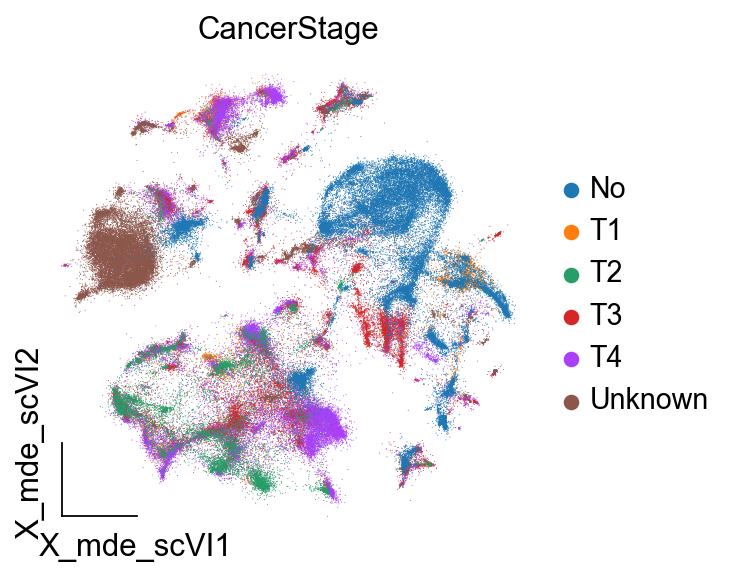

In [33]:
ov.pl.embedding(adata,
                basis='X_mde_scVI',
                color='CancerStage',
                frameon='small')

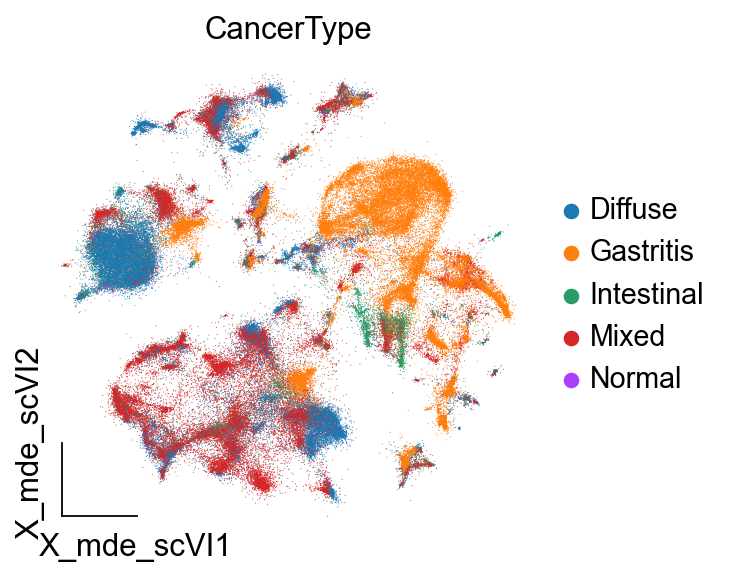

In [34]:
ov.pl.embedding(adata,
                basis='X_mde_scVI',
                color='CancerType',
                frameon='small')

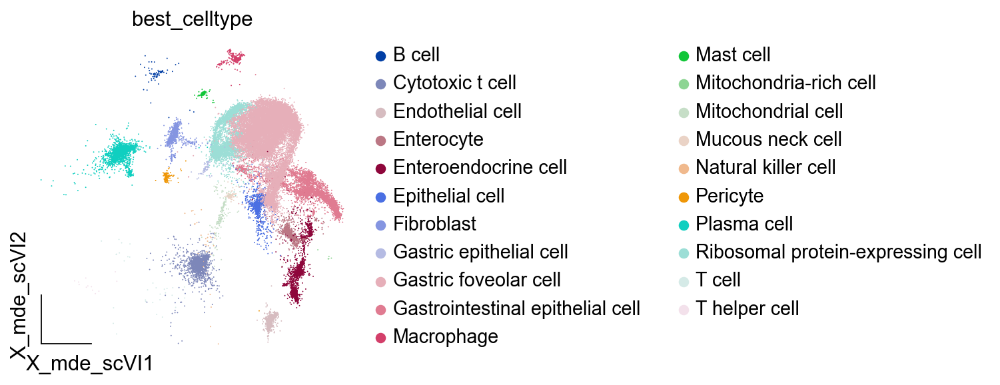

In [35]:
ov.pl.embedding(adata[adata.obs['CancerStage']=='No'],
                basis='X_mde_scVI',
                color='best_celltype',
                frameon='small')

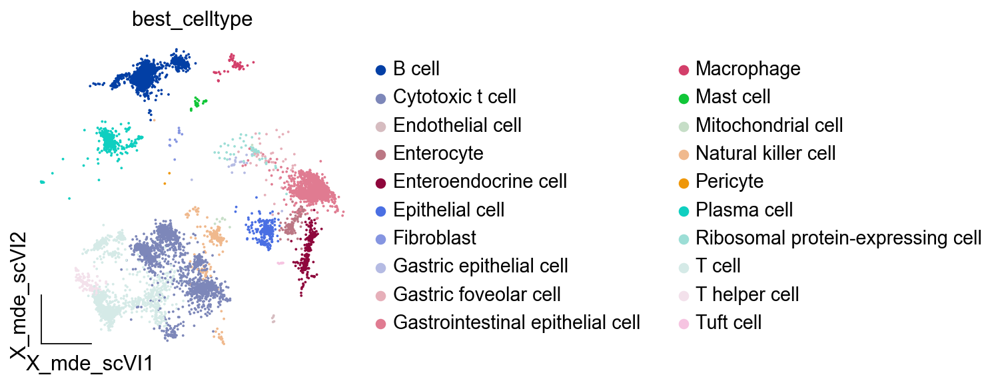

In [36]:
ov.pl.embedding(adata[adata.obs['CancerStage']=='T1'],
                basis='X_mde_scVI',
                color='best_celltype',
                frameon='small')

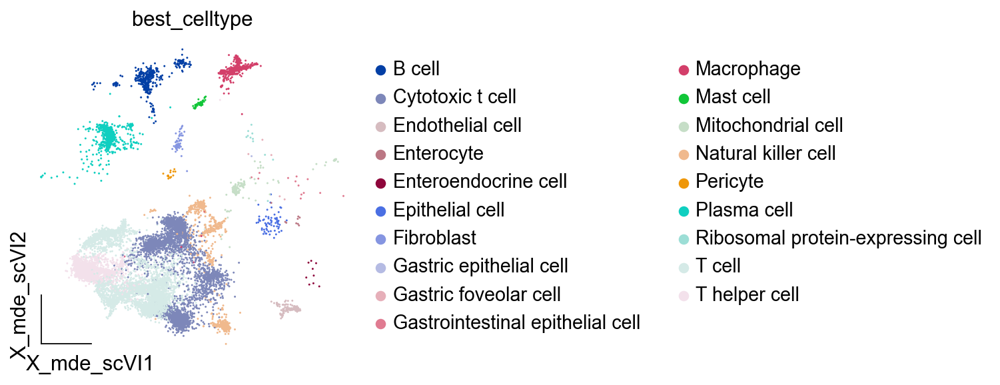

In [37]:
ov.pl.embedding(adata[adata.obs['CancerStage']=='T2'],
                basis='X_mde_scVI',
                color='best_celltype',
                frameon='small')

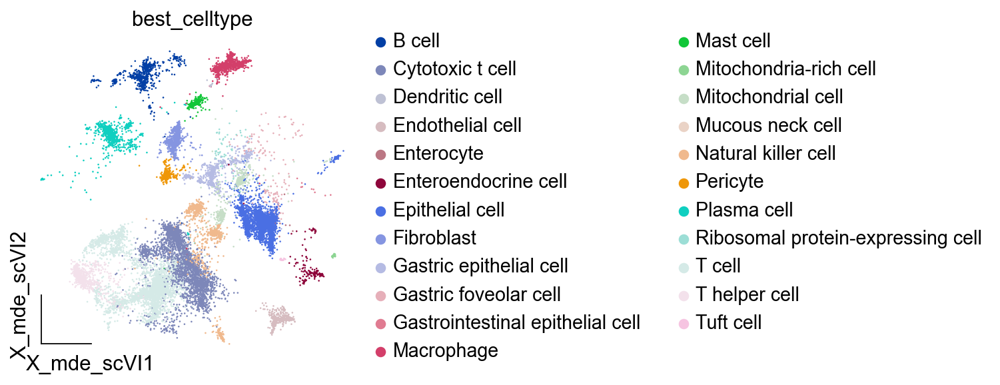

In [38]:
ov.pl.embedding(adata[adata.obs['CancerStage']=='T3'],
                basis='X_mde_scVI',
                color='best_celltype',
                frameon='small')

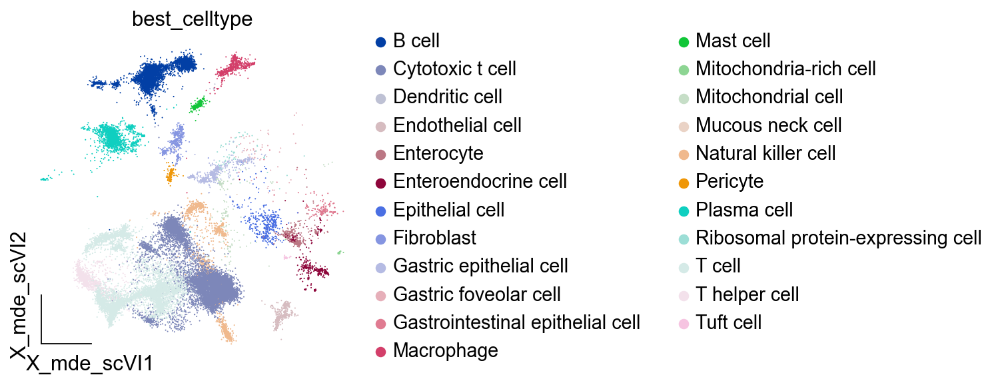

In [39]:
ov.pl.embedding(adata[adata.obs['CancerStage']=='T4'],
                basis='X_mde_scVI',
                color='best_celltype',
                frameon='small')

In [40]:
adata.write('data/GC_All_ANNO.h5ad',compression='gzip')

In [27]:

def get_cluster_celltype(cluster_celltypes, cluster_markers, species, organization,
                        model,base_url):
    from openai import OpenAI
    import os
    import numpy as np
    import pandas as pd
    if base_url is None:
        if provider == 'openai':
            base_url = "https://api.openai.com/v1/"
        elif provider == 'kimi':
            base_url = "https://api.moonshot.cn/v1"
        elif provider == 'qwen':
            base_url = "https://dashscope.aliyuncs.com/compatible-mode/v1"
    QWEN_API_KEY = os.getenv("AGI_API_KEY")
    if QWEN_API_KEY == "":
        print("Note: AGI API key not found: returning the prompt itself.")
        API_flag = False
    else:
        API_flag = True
    client = OpenAI(
        api_key=QWEN_API_KEY, # 如果您没有配置环境变量，请在此处用您的API Key进行替换
        base_url=base_url,
    )
    
    cluster_celltype = {}
    from tqdm import tqdm
    for cluster_id, celltypes in tqdm(cluster_celltypes.items()):
        markers = cluster_markers.get(cluster_id, [])
        
        # 构造提示信息
        prompt = (
            f"Given the species: {species} and organization: {organization}, "
            f"determine the most suitable cell type for cluster {cluster_id}. "
            f"The possible cell types are: {', '.join(celltypes)}. "
            f"The gene markers for this cluster are: {', '.join(markers)}. "
            f"Which cell type best represents this cluster? "
            f"Only provide the cell type name. Do not show numbers before the name. Some can be a mixture of multiple cell types."
            f"Do not provide the plural form of celltype."
        )
        
        # 调用 OpenAI API
        #response = client.chat.completions.create(
        #            model=model,
        #            messages=[{"role": "user", 
        #                       "content": f'Identify cell types of {tissuename} cells using the following markers separately for each row. Only provide the cell type name. Do not show numbers before the name. Some can be a mixture of multiple cell types.\n' + '\n'.join([input[list(input.keys())[j]] for j in id_list if input[list(input.keys())[j]] != 'unknown'])}]
        #        )
        response = client.chat.completions.create(
            model=model,  # 使用 GPT-4 引擎
            messages=[{"role": "user", 
                               "content": prompt}],
            max_tokens=50,
            n=1,
            stop=None,
            temperature=0.2,  # 设置温度以减少结果的随机性
        )

        # 获取模型的回答
        answer = response.choices[0].message.content.split('\n')
        
        # 将回答加入结果字典
        cluster_celltype[cluster_id] = answer[0].lower()
    
    return cluster_celltype



In [1]:
import omicverse as ov
ov.plot_set()

2024-11-22 01:41:20.088701: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-22 01:41:20.109881: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-22 01:41:20.116340: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-22 01:41:21.174137: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT



   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.9, Tutorials: https://omicverse.readthedocs.io/
Dependency error: (pydeseq2 0.4.11 (/mnt/home/zehuazeng/software/rsc/lib/python3.10/site-packages), Requirement.parse('pydeseq2<=0.4.0,>=0.3'))


In [3]:
adata=ov.read('data/GC_RNA/GC_All_ANNO.h5ad',compression='gzip')
adata

AnnData object with n_obs × n_vars = 150222 × 15496
    obs: 'patient', 'CancerType', 'CancerStage', 'nUMIs', 'mito_perc', 'detected_genes', 'cell_complexity', 'n_genes', 'doublet_score', 'predicted_doublet', 'passing_mt', 'passing_nUMIs', 'passing_ngenes', '_scvi_batch', '_scvi_labels', 'leiden', 'celltype_gbi', 'celltype_gpt', 'best_clusters', 'gpt_celltype_0', 'gpt_celltype_1', 'gpt_celltype_2', 'gpt_celltype_3', 'gpt_celltype_4', 'best_celltype', 'Major_celltype', 'Minor_celltype', 'C_scANVI', 'cell_type_from_scMulan', 'cell_type_from_mulan_smoothing', 'smoothing_score'
    var: 'mt', 'n_cells', 'percent_cells', 'robust', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly_variable_features'
    uns: 'CancerStage_colors', 'CancerType_colors', 'Smoothing', 'bench_best_res', 'best_celltype_colors', 'cell_type_from_mulan_smoothing_colors', 'cell_type_from_scMulan_colors', 'celltype_gbi_colors', 'dendro

In [6]:
import scanpy as sc
sc.pp.normalize_total(
    adata,
    target_sum=50*1e4,
    exclude_highly_expressed=True,
    max_fraction=0.2,
)
sc.pp.log1p(adata)

normalizing counts per cell. The following highly-expressed genes are not considered during normalization factor computation:
['GKN1', 'REG1A', 'REG3A', 'GCG', 'PTMA', 'GHRL', 'CCK', 'SST', 'CXCL14', 'HLA-B', 'MLN', 'PGC', 'DEFA6', 'DEFA5', 'SPINK4', 'CCL21', 'LIPF', 'HBB', 'PGA3', 'PGA5', 'FTH1', 'MALAT1', 'APOA1', 'LYZ', 'NTS', 'CHGA', 'CRIP1', 'B2M', 'HBA2', 'HBA1', 'MT2A', 'MT1G', 'CCL4', 'GAST', 'GIP', 'TTR', 'FTL', 'TFF2', 'TFF1', 'IGLL5', 'TMSB4X']
    finished (0:00:01)


In [7]:
adata.raw=adata
adata=adata[:,adata.var.highly_variable_features]
adata

View of AnnData object with n_obs × n_vars = 150222 × 3000
    obs: 'patient', 'CancerType', 'CancerStage', 'nUMIs', 'mito_perc', 'detected_genes', 'cell_complexity', 'n_genes', 'doublet_score', 'predicted_doublet', 'passing_mt', 'passing_nUMIs', 'passing_ngenes', '_scvi_batch', '_scvi_labels', 'leiden', 'celltype_gbi', 'celltype_gpt', 'best_clusters', 'gpt_celltype_0', 'gpt_celltype_1', 'gpt_celltype_2', 'gpt_celltype_3', 'gpt_celltype_4', 'best_celltype', 'Major_celltype', 'Minor_celltype', 'C_scANVI', 'cell_type_from_scMulan', 'cell_type_from_mulan_smoothing', 'smoothing_score'
    var: 'mt', 'n_cells', 'percent_cells', 'robust', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly_variable_features'
    uns: 'CancerStage_colors', 'CancerType_colors', 'Smoothing', 'bench_best_res', 'best_celltype_colors', 'cell_type_from_mulan_smoothing_colors', 'cell_type_from_scMulan_colors', 'dendrogram_leiden', 'h

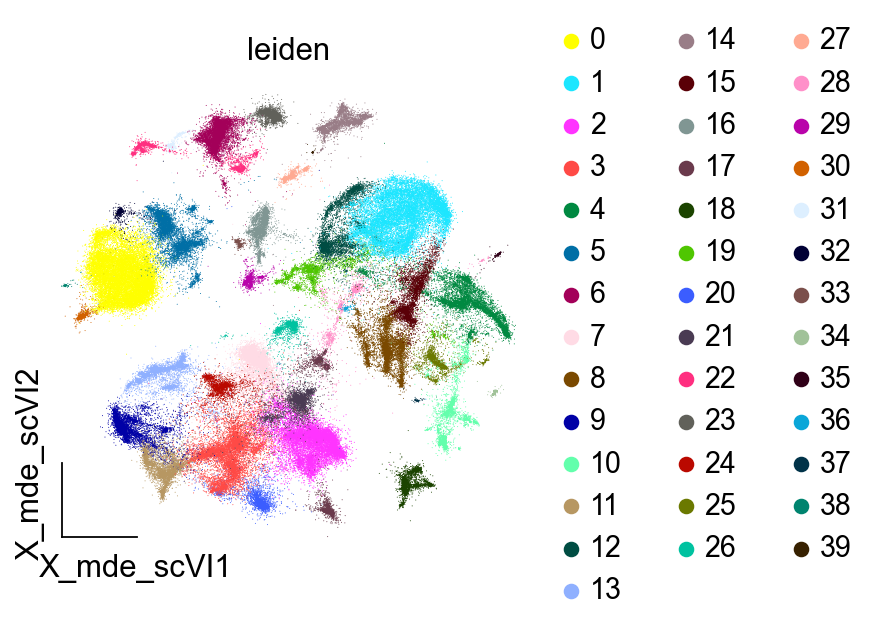

In [5]:
ov.pl.embedding(adata,
                basis='X_mde_scVI',
                color='leiden',
                frameon='small')

Storing dendrogram info using `.uns['dendrogram_leiden']`
ranking genes
    finished: added to `.uns['leiden_ttest']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:12)


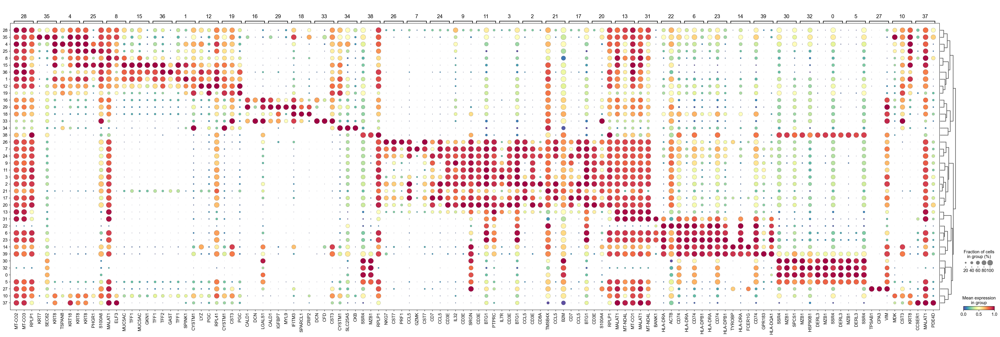

In [8]:
sc.tl.dendrogram(adata,'leiden',use_rep='X_scVI')
sc.tl.rank_genes_groups(adata, 'leiden', use_rep='X_scVI',
                        method='t-test',use_raw=False,key_added='leiden_ttest')
sc.pl.rank_genes_groups_dotplot(adata,groupby='leiden',
                                cmap='Spectral_r',key='leiden_ttest',
                                standard_scale='var',n_genes=3)

<AxesSubplot: title={'center': 'MUC6'}, xlabel='X_mde_scVI1', ylabel='X_mde_scVI2'>

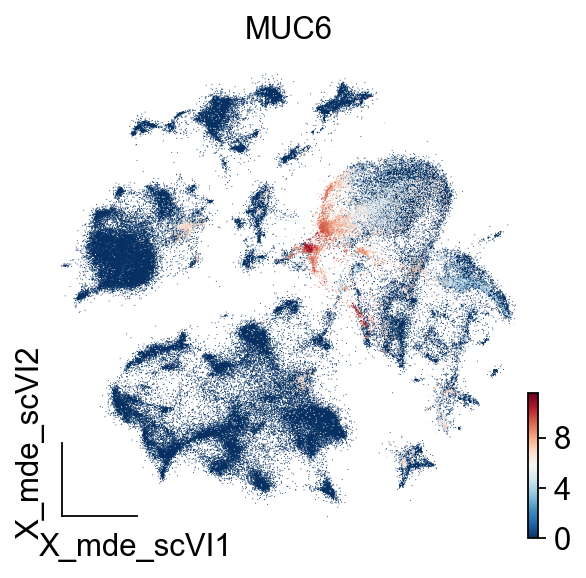

In [32]:
ov.utils.embedding(adata,
                basis='X_mde_scVI',frameon='small',
                color=['MUC6'],show=False)

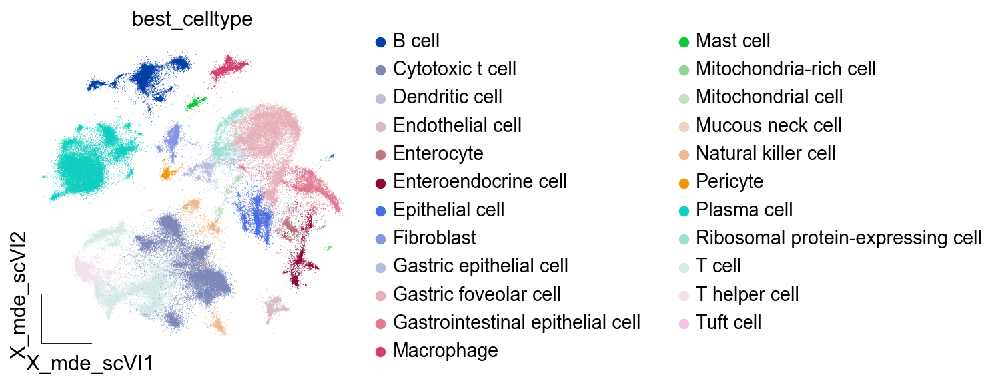

In [7]:
ov.pl.embedding(adata,
                basis='X_mde_scVI',
                color='best_celltype',
                frameon='small')

In [24]:
adata.obs['best_celltype']=adata.obs['best_celltype'].astype(str)
adata.obs.loc[adata.obs['best_celltype'].isin(['Gastric epithelial cell']),'best_celltype']='Gastric Chief cell'
adata.obs.loc[adata.obs['best_celltype'].isin(['Gastrointestinal epithelial cell']),'best_celltype']='Enterocyte'
adata.obs.loc[adata.obs['best_celltype'].isin(['Epithelial cell']),'best_celltype']='Gastric foveolar cell'
#pyloric gland

In [34]:
adata.obs['best_celltype']=adata.obs['best_celltype'].astype(str)
adata.obs.loc[adata.obs['best_celltype'].isin(['Ribosomal protein-expressing cell']),'best_celltype']='Pyloric gland cell'


In [37]:
adata=adata[~adata.obs['best_celltype'].isin(['Mitochondrial cell','Mitochondria-rich cell'])]

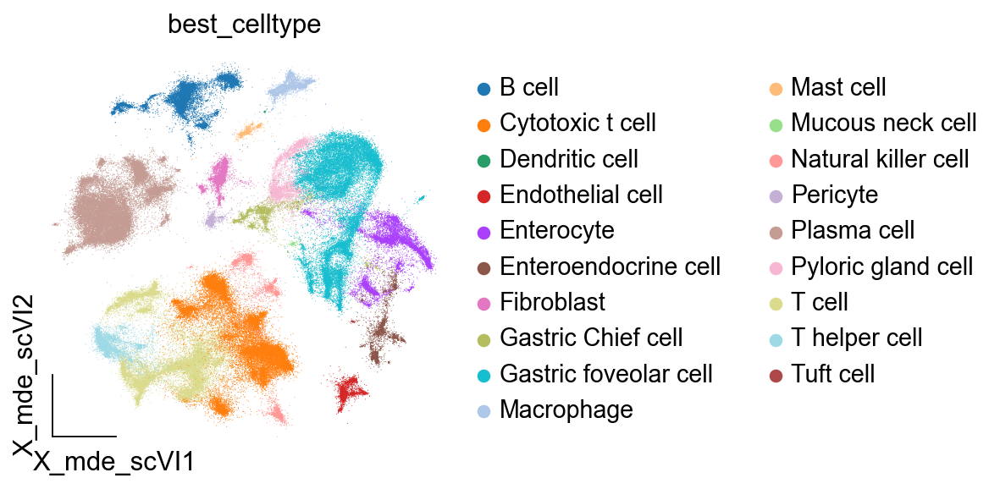

In [38]:
ov.pl.embedding(adata,
                basis='X_mde_scVI',
                color='best_celltype',
                frameon='small')

In [39]:
adata.obs.to_csv('data/GC_RNA/GC_ANNO_OBS.csv')

In [40]:
adata.write('data/GC_RNA/GC_ANNO.h5ad',compression='gzip')

In [9]:
dict(zip(
    adata.obs['leiden'].tolist(),
    adata.obs['best_celltype'].tolist(),
))

{'16': 'Fibroblast',
 '37': 'Tuft cell',
 '11': 'T cell',
 '2': 'Cytotoxic t cell',
 '23': 'B cell',
 '8': 'Epithelial cell',
 '5': 'Plasma cell',
 '7': 'Cytotoxic t cell',
 '6': 'B cell',
 '24': 'Cytotoxic t cell',
 '14': 'Macrophage',
 '3': 'T cell',
 '17': 'Natural killer cell',
 '31': 'B cell',
 '10': 'Enteroendocrine cell',
 '20': 'Cytotoxic t cell',
 '13': 'T cell',
 '4': 'Gastrointestinal epithelial cell',
 '9': 'T helper cell',
 '27': 'Mast cell',
 '25': 'Enterocyte',
 '12': 'Ribosomal protein-expressing cell',
 '32': 'Plasma cell',
 '19': 'Gastric epithelial cell',
 '28': 'Mitochondrial cell',
 '26': 'Natural killer cell',
 '1': 'Gastric foveolar cell',
 '21': 'Cytotoxic t cell',
 '0': 'Plasma cell',
 '15': 'Gastric foveolar cell',
 '22': 'B cell',
 '38': 'Plasma cell',
 '29': 'Pericyte',
 '33': 'Fibroblast',
 '18': 'Endothelial cell',
 '34': 'Mitochondria-rich cell',
 '39': 'Dendritic cell',
 '36': 'Mucous neck cell',
 '35': 'Epithelial cell',
 '30': 'Plasma cell'}

In [12]:
ct='Macrophage'
dict(zip(
    adata[adata.obs['best_celltype']==ct].obs['leiden'].tolist(),
    adata[adata.obs['best_celltype']==ct].obs['best_celltype'].tolist(),
))

{'14': 'Macrophage'}

In [8]:
def generate_cellanno_dict(adata,cluster_key):
    adata.obs[cluster_key]=adata.obs[cluster_key].astype('category')
    return dict(zip(adata.obs[cluster_key].cat.categories,['']*len(adata.obs[cluster_key].cat.categories)))

generate_cellanno_dict(adata,'leiden')

{'0': '',
 '1': '',
 '2': '',
 '3': '',
 '4': '',
 '5': '',
 '6': '',
 '7': '',
 '8': '',
 '9': '',
 '10': '',
 '11': '',
 '12': '',
 '13': '',
 '14': '',
 '15': '',
 '16': '',
 '17': '',
 '18': '',
 '19': '',
 '20': '',
 '21': '',
 '22': '',
 '23': '',
 '24': '',
 '25': '',
 '26': '',
 '27': '',
 '28': '',
 '29': '',
 '30': '',
 '31': '',
 '32': '',
 '33': '',
 '34': '',
 '35': '',
 '36': '',
 '37': '',
 '38': '',
 '39': ''}

<AxesSubplot: title={'center': 'new_celltype'}, xlabel='X_mde_scVI1', ylabel='X_mde_scVI2'>

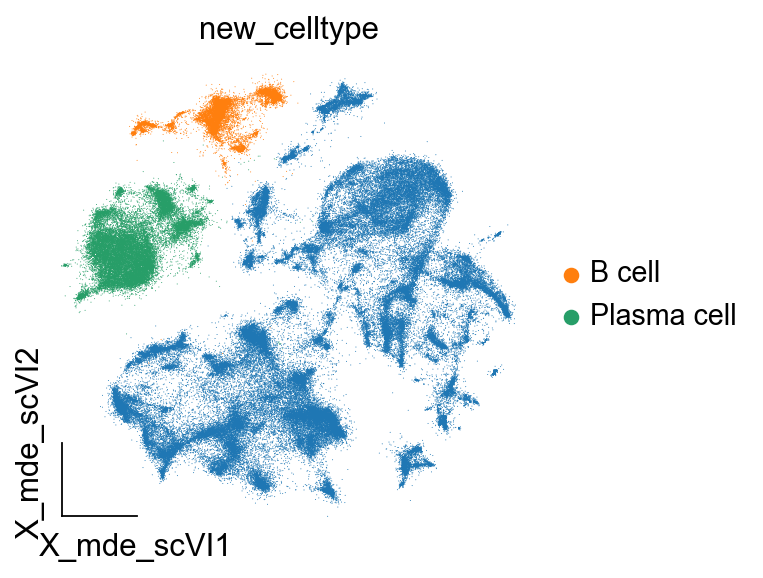

In [12]:
cluster2annotation={'0': 'Plasma cell',
 '1': '',
 '2': '',
 '3': '',
 '4': '',
 '5': 'Plasma cell',
 '6': 'B cell',
 '7': '',
 '8': '',
 '9': '',
 '10': '',
 '11': '',
 '12': '',
 '13': '',
 '14': 'Macrophage',
 '15': '',
 '16': '',
 '17': '',
 '18': '',
 '19': '',
 '20': '',
 '21': '',
 '22': 'B cell',
 '23': 'B cell',
 '24': '',
 '25': '',
 '26': '',
 '27': '',
 '28': '',
 '29': '',
 '30': 'Plasma cell',
 '31': 'B cell',
 '32': 'Plasma cell',
 '33': '',
 '34': '',
 '35': '',
 '36': '',
 '37': '',
 '38': 'Plasma cell',
 '39': ''}

adata.obs['new_celltype'] = adata.obs['leiden'].map(cluster2annotation).astype('category')
ov.utils.embedding(adata,
                basis='X_mde_scVI',frameon='small',
                color=['new_celltype'],
                #palette=ov.utils.blue_color+ov.utils.orange_color+ov.utils.red_color+ov.utils.green_color,
                show=False)